In [1]:
# imports
import numpy as np
import matplotlib.pyplot as plt
from astropy.coordinates import SkyCoord
import astropy.units as u
import pandas as pd
import gc  # For garbage collection
import os

import scienceplots

plt.style.use(['science','ieee', 'bright'])

In [2]:
# read glade plus catalog
fname = "/home/davendra_glade_plus_catalog/gw-hands-on-school-2025/GLADE_plus_subset.txt"

df = pd.read_csv(fname, sep='\s+', header=None, dtype=str)
raw = df.values

print(raw.shape)

(23181758, 4)


In [3]:
ra_str = raw[:, 0]
dec_str = raw[:, 1] 
dist_str = raw[:, 2]
z_str = raw[:, 3]

# Convert to float, handling missing values ('None', '')
def to_float(arr, bad_values=('None', '', 'null')):
    arr = np.asarray(arr, dtype=str)
    out = np.full(arr.shape, np.nan, dtype=float)
    mask = np.ones(arr.shape, dtype=bool)
    for bad in bad_values:
        mask &= (arr != bad)
    # only convert "good" strings
    out[mask] = arr[mask].astype(float)
    return out

ra_deg  = to_float(ra_str)
dec_deg = to_float(dec_str)
dist_Mpc = to_float(dist_str)
z       = to_float(z_str)

print("Loaded:", len(ra_deg), "rows")
print("Example:", ra_deg[:3], dec_deg[:3], z[:3])

# Clean up string arrays to save memory
del ra_str, dec_str, dist_str, z_str, raw, df
gc.collect()

Loaded: 23181758 rows
Example: [192.721451 188.860123 267.360474] [41.120152 14.49632  70.144341] [0.001733   0.00357327 0.00280305]


0

In [4]:
# convert to radians for plotting
ra_rad  = np.deg2rad(ra_deg)
dec_rad = np.deg2rad(dec_deg)

# Wrap RA around 180° and flip so RA increases to the left (sky convention)
ra_wrapped = np.remainder(ra_rad + np.pi, 2 * np.pi) - np.pi
ra_wrapped = -ra_wrapped

In [5]:
# Convert RA/Dec to Galactic coordinates in batches and save/load
galactic_file = "GLADE_galactic_coords.txt"

if os.path.exists(galactic_file):
    print(f"Loading saved galactic coordinates from {galactic_file}")
    data = np.loadtxt(galactic_file)
    l_wrapped = data[:, 0]
    b_gal = data[:, 1]
    z_valid = data[:, 2]
    print(f"Loaded {len(l_wrapped)} points")
else:
    print("Converting RA/Dec to Galactic coordinates in batches...")
    
    # Filter out NaN values first to reduce data size
    valid_mask = ~(np.isnan(ra_deg) | np.isnan(dec_deg) | np.isnan(z))
    ra_valid = ra_deg[valid_mask]
    dec_valid = dec_deg[valid_mask] 
    z_valid = z[valid_mask]

    print(f"Processing {len(ra_valid)} valid data points")

    # Process in batches to avoid memory overload
    batch_size = 50000  # Process 50k points at a time
    n_batches = (len(ra_valid) + batch_size - 1) // batch_size

    l_gal_list = []
    b_gal_list = []

    for i in range(n_batches):
        start_idx = i * batch_size
        end_idx = min((i + 1) * batch_size, len(ra_valid))
        
        print(f"Processing batch {i+1}/{n_batches} ({start_idx}:{end_idx})")
        
        # Process batch
        ra_batch = ra_valid[start_idx:end_idx]
        dec_batch = dec_valid[start_idx:end_idx]
        
        # Convert batch to galactic coordinates
        coords_batch = SkyCoord(ra=ra_batch * u.deg, dec=dec_batch * u.deg, frame="icrs")
        l_gal_batch = coords_batch.galactic.l.wrap_at(180 * u.deg).radian
        b_gal_batch = coords_batch.galactic.b.radian
        
        # Store results
        l_gal_list.append(l_gal_batch)
        b_gal_list.append(b_gal_batch)
        
        # Clean up batch data
        del coords_batch, ra_batch, dec_batch, l_gal_batch, b_gal_batch
        gc.collect()

    # Combine all batches
    l_gal = np.concatenate(l_gal_list)
    b_gal = np.concatenate(b_gal_list)

    # Clean up intermediate lists
    del l_gal_list, b_gal_list
    gc.collect()

    # Wrap longitude for proper mollweide projection
    l_wrapped = np.remainder(l_gal + np.pi, 2 * np.pi) - np.pi
    l_wrapped = -l_wrapped

    print(f"Coordinate conversion complete. Final data size: {len(l_wrapped)} points")
    
    # Save as text file: l_wrapped, b_gal, z_valid
    output_data = np.column_stack([l_wrapped, b_gal, z_valid])
    np.savetxt(galactic_file, output_data, fmt='%.8e', 
               header='l_wrapped b_gal z_valid', comments='# ')
    print(f"Saved galactic coordinates to {galactic_file}")
    
    # Clean up
    del l_gal, output_data
    gc.collect()

Converting RA/Dec to Galactic coordinates in batches...
Processing 22635077 valid data points
Processing batch 1/453 (0:50000)
Processing batch 2/453 (50000:100000)
Processing batch 3/453 (100000:150000)
Processing batch 4/453 (150000:200000)
Processing batch 5/453 (200000:250000)
Processing batch 6/453 (250000:300000)
Processing batch 7/453 (300000:350000)
Processing batch 8/453 (350000:400000)
Processing batch 9/453 (400000:450000)
Processing batch 10/453 (450000:500000)
Processing batch 11/453 (500000:550000)
Processing batch 12/453 (550000:600000)
Processing batch 13/453 (600000:650000)
Processing batch 14/453 (650000:700000)
Processing batch 15/453 (700000:750000)
Processing batch 16/453 (750000:800000)
Processing batch 17/453 (800000:850000)
Processing batch 18/453 (850000:900000)
Processing batch 19/453 (900000:950000)
Processing batch 20/453 (950000:1000000)
Processing batch 21/453 (1000000:1050000)
Processing batch 22/453 (1050000:1100000)
Processing batch 23/453 (1100000:1150

Clearing memory...
Loading galactic coordinates from GLADE_galactic_coords.txt
Loaded 22635077 points
Creating plot...


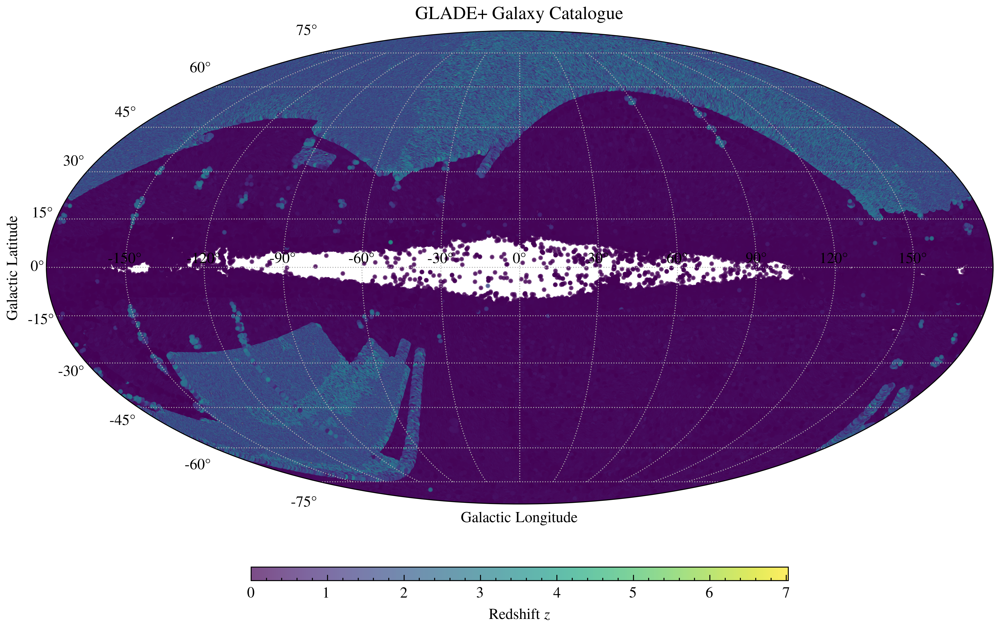

Clearing memory after plotting...
Done!


In [11]:
# Clear memory and load galactic coordinates for plotting
galactic_file = "GLADE_galactic_coords.txt"  # Note: .txt file

# Clear memory first
print("Clearing memory...")
gc.collect()

# Load saved galactic coordinates from text file
print(f"Loading galactic coordinates from {galactic_file}")
data = np.loadtxt(galactic_file)  # Use loadtxt for .txt files
l_wrapped = data[:, 0]
b_gal = data[:, 1]
z_valid = data[:, 2]
print(f"Loaded {len(l_wrapped)} points")

# Clear memory again before plotting
gc.collect()

# Plot in galactic coordinates - Mollweide projection
print("Creating plot...")
plt.figure(figsize=(10, 5))
ax = plt.subplot(111, projection="mollweide")

sc = ax.scatter(l_wrapped, b_gal, c=z_valid, s=2, alpha=0.7, rasterized=True)

ax.grid(True, linestyle=":", linewidth=0.5)
ax.set_xlabel("Galactic Longitude")
ax.set_ylabel("Galactic Latitude")
ax.set_title("GLADE+ Galaxy Catalogue")

# Create colorbar
cbar = plt.colorbar(sc, ax=ax, orientation="horizontal", 
                   shrink=0.4, aspect=40, pad=0.1)
cbar.set_label(r"Redshift $z$")

plt.tight_layout()
plt.savefig('galaxy_plus.png', dpi=300, bbox_inches='tight')
plt.show()

# Clear memory after plotting
print("Clearing memory after plotting...")
del l_wrapped, b_gal, z_valid, data
gc.collect()
print("Done!")